# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

# Step 1: Install Requirements

In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5
Setup complete. Using torch 1.10.0+cu111 (Tesla P100-PCIE-16GB)


# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

In Roboflow, you can choose between two paths:

* Convert an existing dataset to YOLOv5 format. Roboflow supports over [30 formats object detection formats](https://roboflow.com/formats) for conversion.
* Upload raw images and annotate them in Roboflow with [Roboflow Annotate](https://docs.roboflow.com/annotate).

# Annotate

![](https://github.com/roboflow-ai/yolov5/wiki/images/roboflow-annotate.gif)

# Version

![](https://github.com/roboflow-ai/yolov5/wiki/images/roboflow-preprocessing.png)

# Export

![](https://github.com/roboflow-ai/yolov5/wiki/images/roboflow-export.png)

# Download Code 

![](https://github.com/roboflow-ai/yolov5/wiki/images/roboflow-snippet.png)

In [ ]:
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse
from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass
!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}
%cd /content
!mkdir drive
%cd drive
!mkdir MyDrive
%cd ..
%cd ..
!google-drive-ocamlfuse /content/drive/MyDrive

E: Package 'python-software-properties' has no installation candidate
Selecting previously unselected package google-drive-ocamlfuse.
(Reading database ... 155229 files and directories currently installed.)
Preparing to unpack .../google-drive-ocamlfuse_0.7.27-0ubuntu1~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.27-0ubuntu1~ubuntu18.04.1) ...
Setting up google-drive-ocamlfuse (0.7.27-0ubuntu1~ubuntu18.04.1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force
··········
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope

In [ ]:
from google.colab import drive
drive._mount('/content/drive')

ValueError: ignored

In [ ]:
VERSION = "v4"

In [ ]:
!unzip -q /content/drive/MyDrive/RummikubHelper/{VERSION}.zip -d ./

In [ ]:
!unzip -q /content/drive/MyDrive/RummikubHelper/test.zip -d ./

# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
# Weights & Biases  (optional)
%pip install -q wandb
import wandb
wandb.login()

wandb: Currently logged in as: kostyayatsok (use `wandb login --relogin` to force relogin)


True

In [ ]:
!rm -r runs

In [ ]:
# !python train.py --img 640 --batch 16 --epochs 100 --data /content/yolov5/{VERSION}/data.yaml --weights yolov5s.pt --patience 10 #--cache #--freeze 10
!python train.py --img 416 --batch 16 --epochs 100 --data /content/yolov5/{VERSION}/data.yaml --weights /content/drive/MyDrive/RummikubHelper/v4.pt

wandb: Currently logged in as: kostyayatsok (use `wandb login --relogin` to force relogin)
train: weights=/content/drive/MyDrive/RummikubHelper/v4.pt, cfg=, data=/content/yolov5/v4/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-200-g9708cf5 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, c

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs s ave in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 1909), started 13:48:28 ago. (Use '!kill 1909' to kill it.)

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source ./processed/ --line-thickness 1

detect: weights=['runs/train/exp/weights/best.pt'], source=./processed/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-200-g9708cf5 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7058671 parameters, 0 gradients, 15.9 GFLOPs
image 1/6 /content/yolov5/processed/00.jpg: 640x640 3 1s, 3 2s, 3 3s, 5 4s, 4 blues, 4 blacks, 4 oranges, 4 reds, Done. (0.007s)
image 2/6 /content/yolov5/processed/01.jpg: 640x640 4 8s, 4 9s, 4 10s, 4 11s, 4 12s, 3 13s, 4 blues, 7 blacks, 6 oranges, 6 reds, Done. (0.007s)
image 3/6 /content/yolov5/processed/02.jpg: 640x640 3 9s, 1 10, 2 13s, 2 blues, 1 black, 2 orang

In [ ]:
# !python detect.py --weights /content/drive/MyDrive/RummikubHelper/v1.pt --img 416 --conf 0.1 --source ./processed/ --line-thickness 1 --

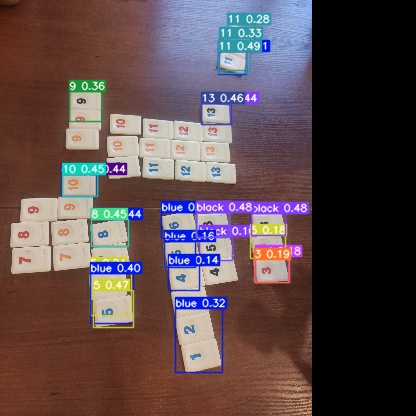

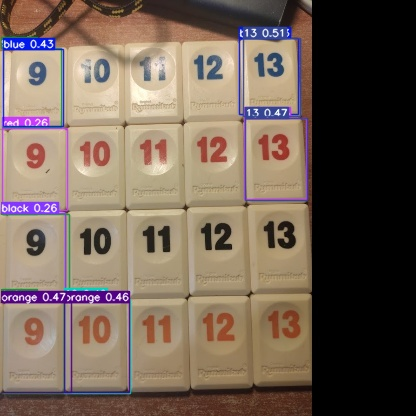

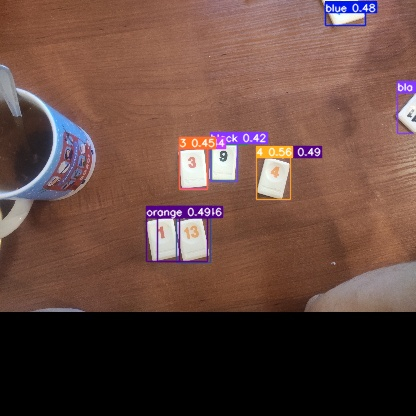

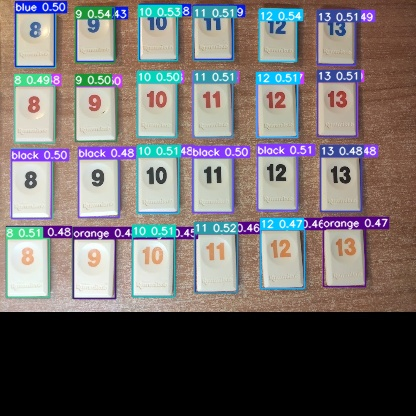

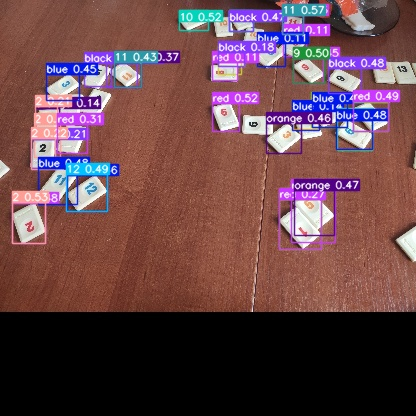

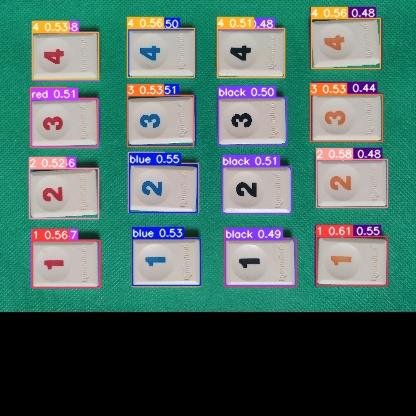

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName, width=640))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weghts for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!cp ./runs/train/exp/weights/best.pt /content/drive/MyDrive/RummikubHelper/{VERSION}.pt

# Measure Test performance

In [ ]:
!python val.py --weights /content/drive/MyDrive/RummikubHelper/v4.pt --data /content/yolov5/v4/data.yaml --img 640

val: data=/content/yolov5/v4/data.yaml, weights=['/content/drive/MyDrive/RummikubHelper/v4.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.0-205-gbd815d4 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7058671 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning 'v4/val/labels' images and labels...500 found, 0 missing, 1 empty, 0 corrupt: 100% 500/500 [00:00<00:00, 1933.41it/s]
val: New cache created: v4/val/labels.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 16/16 [00:08<00:00,  1.91it/s]
                 all        500       4134      0.916       0.78      0.858      0.748
                   1        500        133      0.928      0.866   

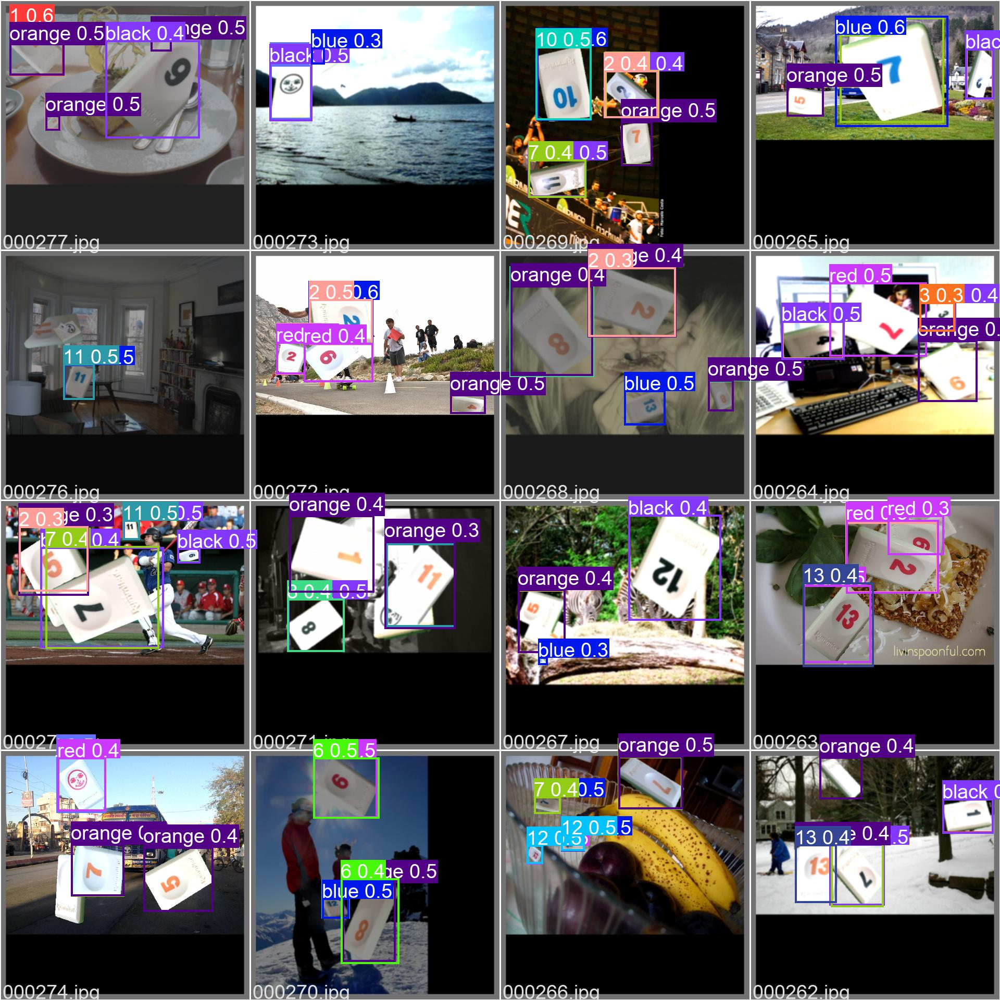

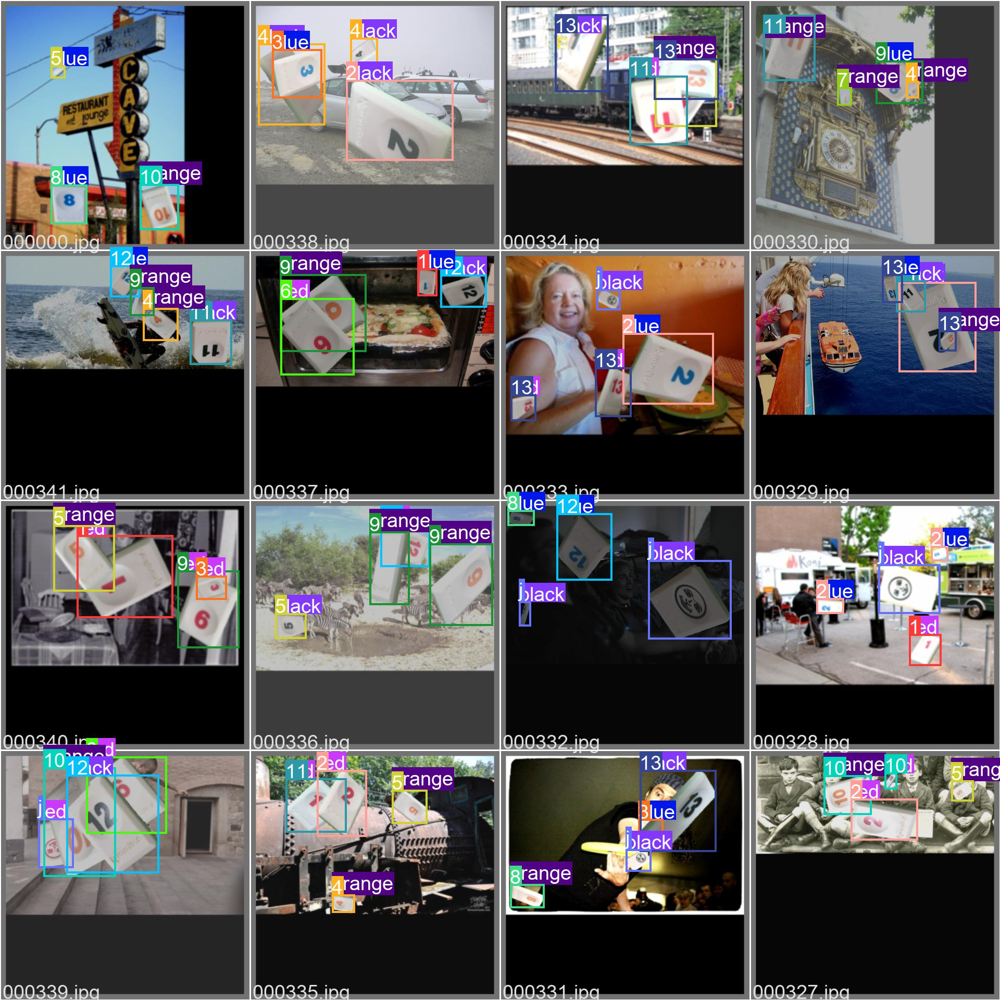

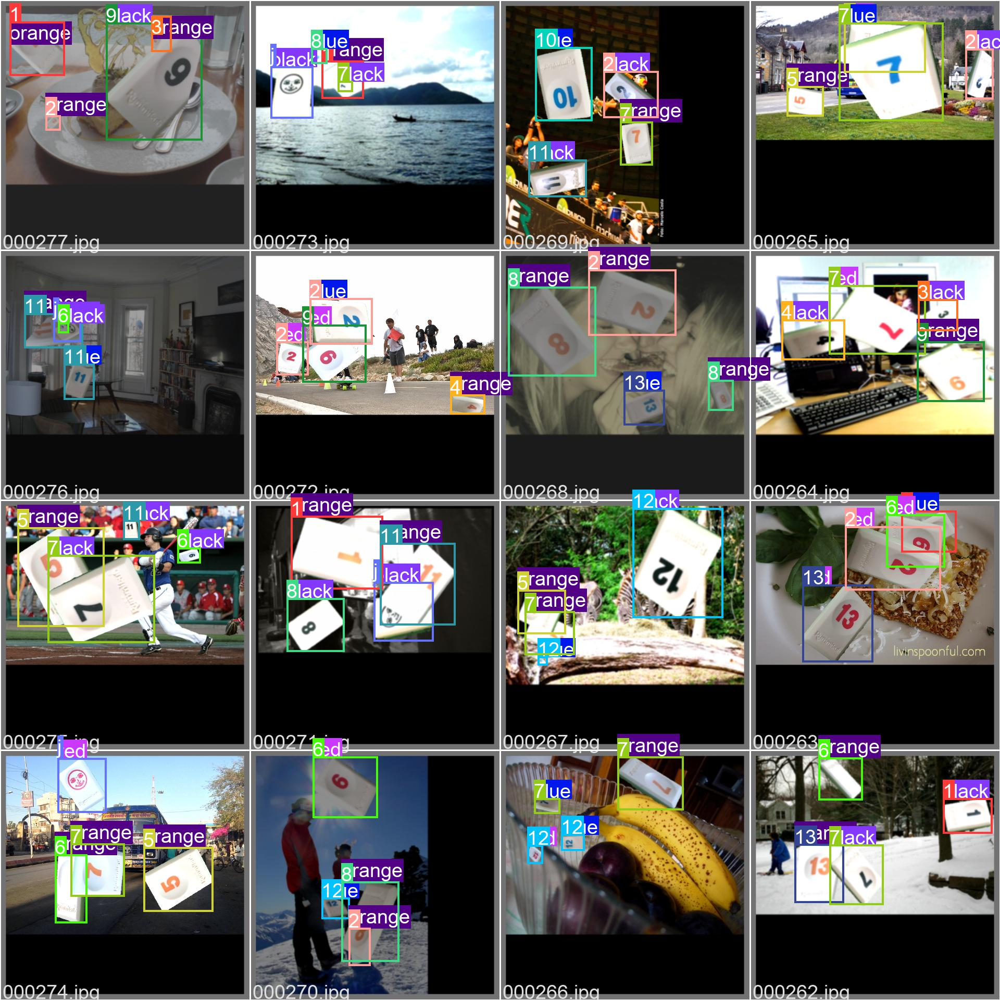

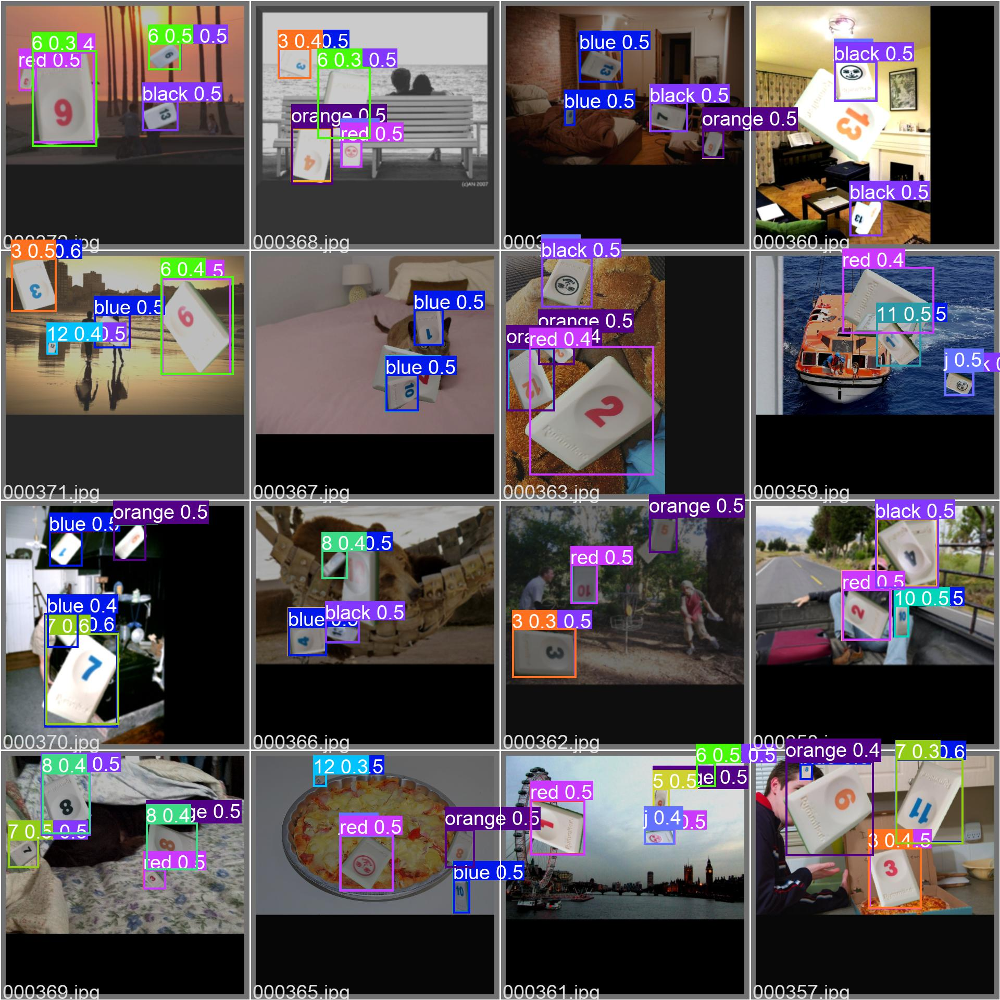

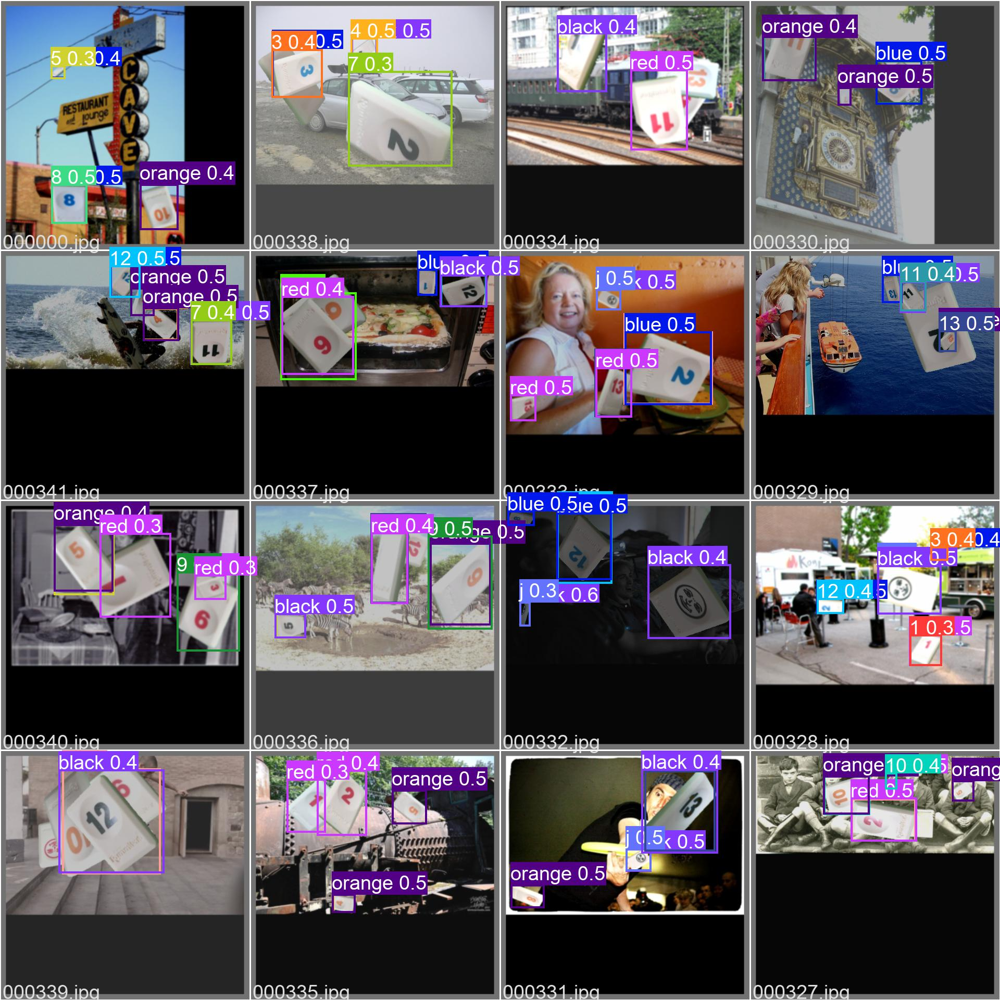

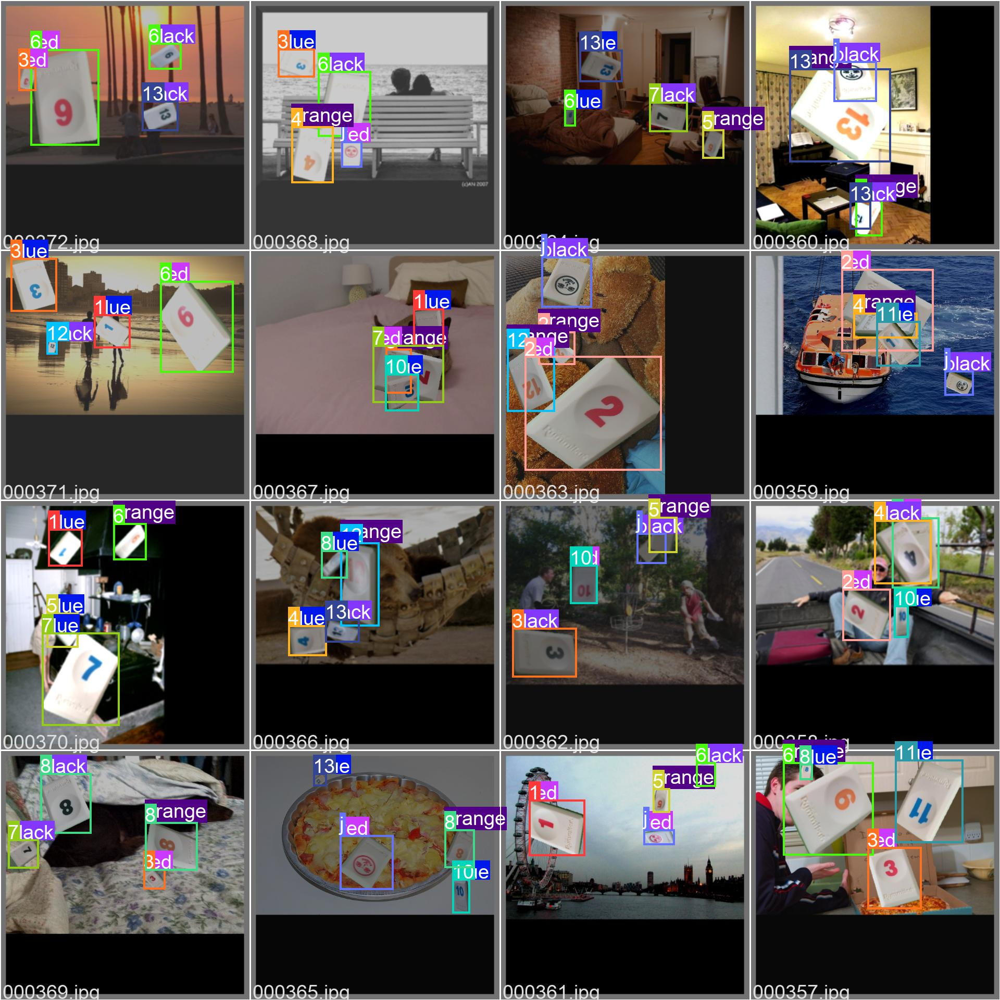

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/val/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName, width=640))
    print("\n")